In [ ]:
#!unzip "/content/drive/MyDrive/Dog vision/dog-breed-identification.zip" -d "/content/drive/MyDrive/Dog vision/"

# End-to-end Multi-class Dog Breed Classification

This notebook build an end-to-end multi-class
image classifier using TensorFlow and TensorFlow Hub

https://www.tensorflow.org/guide/keras

## 1. Problem

Identifying the breed of a dog given by image of a dog.

## 2. Data

The data using is from Kaggle.com

https://www.kaggle.com/c/dog-breed-identification/data

## 3. Evaluation

The evaluation is file with prediction probability for each dog breed of test image

https://www.kaggle.com/c/dog-breed-identification/overview

## 4. Features

Some information about data:
* Dealing with unstructured data, best will be to use deep learning/transfer learning.
* There are 120 breeds of dogs, this means 120 different classes
* There are around 10,000+ images in training set(images have labels)
* There are around 10,000+ images in test set(images dont have labels - predicting target..)


### Get workspace ready to work
* Import TensorFlow version 2.x+
* Import TensorFlow Hub
* Make sure using GPU

In [ ]:
# Import TensorFlow into Colab
import tensorflow as tf
import tensorflow_hub as hub

print("TF version:", tf.__version__)
print("TF hub version:", hub.__version__)

# Check for GPU availability
print("GPU", "Availability - yes" if tf.config.list_physical_devices("GPU") else "not available")

TF version: 2.15.0
TF hub version: 0.16.1
GPU Availability - yes


## Getting data ready to work, turn pictures into tensors

In [ ]:
# Getting data ready and turn pictures into tensors
# Checkout the labels of data
import os
import pandas as pd
labels_csv = pd.read_csv("/content/drive/MyDrive/Dog vision/labels.csv")

# Пътят до папката със снимките
image_directory = "/content/drive/MyDrive/Dog vision/train"
files_in_directory = os.listdir(image_directory)
number_of_files = len(files_in_directory)

print("Number of ids:", len(labels_csv["id"]))
print("Number of breeds:", len(labels_csv["breed"]))
print("Number of files:", number_of_files)

Number of ids: 10222
Number of breeds: 10222
Number of files: 10222


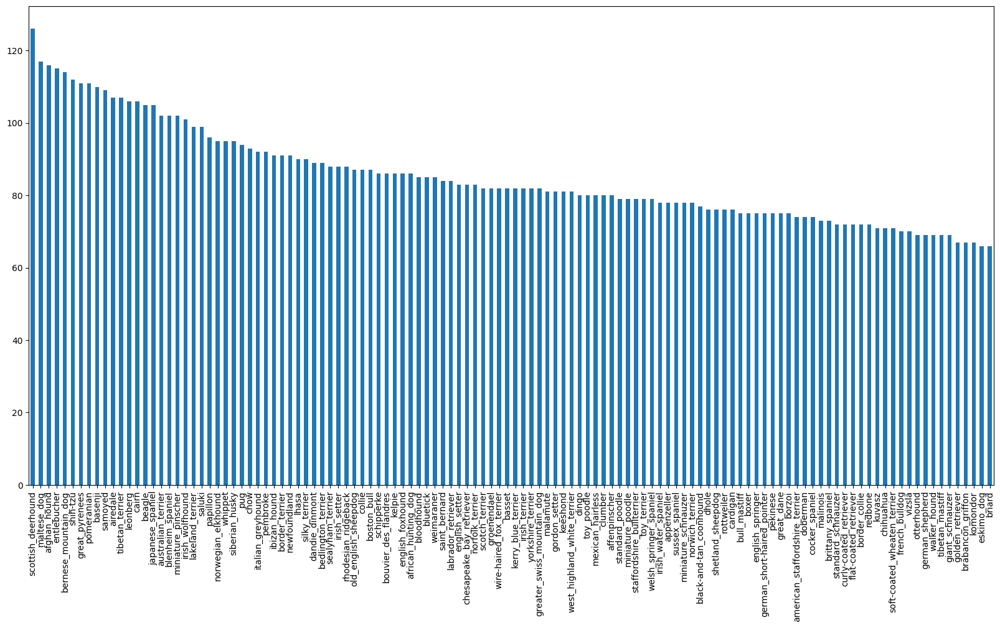

In [ ]:
# How many images are there of each breed ?
labels_csv["breed"].value_counts().plot.bar(figsize=(20, 10));

In [ ]:
labels_csv["breed"].value_counts().median()

82.0

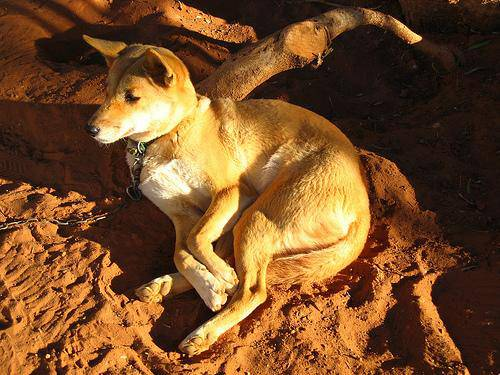

In [ ]:
# Review an image
from IPython.display import Image
Image("/content/drive/MyDrive/Dog vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg")

### Getting images and their labels
* Images will be represented by a list

In [ ]:
# Create pathnames from image ID`s
#   /content/drive/MyDrive/Dog vision/train/
filenamesFromCSV = ["/content/drive/MyDrive/Dog vision/train/" + fname + ".jpg" for fname in labels_csv["id"]]

# Check first 5 id`s from csv file....
filenamesFromCSV[:5]

# Check whether number of filenames matches number of actual image files
import os
if len(os.listdir("/content/drive/MyDrive/Dog vision/train/")) == len(filenamesFromCSV):
  print("MATCH")
else:
  print("PROBLEM - NO MATCH")

MATCH


In [ ]:
import numpy as np

labels_breed = labels_csv["breed"]
labels_breed = np.array(labels_breed)
len(labels_breed)

10222

In [ ]:
# Check if number of labels matches the number of filenames
if len(labels_breed) == len(filenamesFromCSV):
  print("100% MATCH")
else:
  print("BIG PROBLEM - NO MATCH")

100% MATCH


In [ ]:
# Find the unique labels_breed values - should be 120
unique_breeds = np.unique(labels_breed)
len(unique_breeds)

120

In [ ]:
# Turn a single label in to array of booleans
print(labels_breed[0])
labels_breed[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
# Turn everylabel in a boolean array
boolean_breed_labels = [label_breed == unique_breeds for label_breed in labels_breed]
boolean_breed_labels[:3]
len(boolean_breed_labels)

10222

In [ ]:
# Example turning boolean array into integers
print(labels_breed[0]) # Original breed label
print(np.where(unique_breeds == labels_breed[0])) # Index where label occures
print(boolean_breed_labels[0].argmax()) # Index where label occures in boolean array
print(boolean_breed_labels[0].astype(int)) # There will be 1 where the sample label occures

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
print(labels_breed[2])
print(np.where(unique_breeds == labels_breed[2]))
print(boolean_breed_labels[2].astype(int))

pekinese
(array([85]),)
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


### Creating validation set
* Since the data from Kaggle.com doesn`t come with validation set

In [ ]:
# Setup X & y variables
X = filenamesFromCSV
y = boolean_breed_labels

In [ ]:
len(filenamesFromCSV)

10222

In [ ]:
len(boolean_breed_labels)

10222

### Start off experimenting with ~ Images and increase as needed

In [ ]:
# Set number of images to use for experimenting
NUM_IMAGES = 10000 #@param {type: "slider", min:1000, max:10000, step:1000}

In [ ]:
# Split out data into train and validation sets
from sklearn.model_selection import train_test_split

# Split them into training and validation of total size of NUM_IMAGES
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                 y[:NUM_IMAGES],
                                                 test_size=0.2,
                                                 random_state=42)

len(X_train), len(y_train), len(X_val), len(y_val)

(8000, 8000, 2000, 2000)

In [ ]:
X_train[:1], y_train[:1]

(['/content/drive/MyDrive/Dog vision/train/e86be20abe3ab746179728fa6f19bc59.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
          True, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, Fa

## Preprocessing Images (turning images to Tensors)
* Define a helper function for that purpose
1. Take an image filepath as input
2. Use TensorFlow to read the file and save it to a variable, image
3. Turn image into Tensors
4. Resize the image to be a shape of (224, 224)
5. Return the modified image

---



In [ ]:
import tensorflow as tf

# Create function for preprocessing images
def preprocess_image(image_path):
    """
    Image preprocessing function.

    Parameters:
        - image_path.

    Returns:
        - The modified image as a tensor with dimensions (224, 224).
    """
    # Read image from file path
    image = tf.io.read_file(image_path)
    # Image decoding as tensor
    image = tf.image.decode_jpeg(image, channels=3)
    # Image resizing
    image = tf.image.resize(image, [224, 224])
    # Image tensor conversion
    image = tf.cast(image, tf.float32)
    # Normalization of pixel values
    image = image / 255.0
    return image

# Create function for preprocessing images
def preprocess_image_from_video(image_path):
    """
    Image preprocessing function.

    Parameters:
        - image_path.

    Returns:
        - The modified image as a tensor with dimensions (224, 224).
    """
    image = tf.io.read_file(image_path)
    image = tf.image.decode_jpeg(image, channels=3)
    image = tf.image.convert_image_dtype(image, tf.float32)
    image = tf.image.resize(image, [224, 224])
    return image

## Turning data into batches with size 32

In [ ]:
# Create a function to return a tupple of tensors (image, label)
def get_image_label(image_path, label):
  image = preprocess_image_from_video(image_path)
  return image, label

In [ ]:
# Test 1st function
(preprocess_image_from_video(X[42]), tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

In [ ]:
# Test 2nd function
(preprocess_image(X[42]), tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.32641777, 0.5222886 , 0.3232816 ],
         [0.25371668, 0.44366494, 0.24117756],
         [0.2569976 , 0.44670868, 0.23893748],
         ...,
         [0.29325104, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903141, 0.45378068, 0.27294812],
         [0.24375683, 0.44070187, 0.2554778 ],
         [0.28389847, 0.4721338 , 0.28298813],
         ...,
         [0.2785345 , 0.50279915, 0.3100471 ],
         [0.28428745, 0.5108718 , 0.32523632],
         [0.28821915, 0.5148035 , 0.32916805]],
 
        [[0.20941192, 0.4069295 , 0.25792548],
         [0.24045376, 0.43900943, 0.28689107],
         [0.29001114, 0.47937486, 0.32247737],
         ...,
         [0.26074055, 0.48414767, 0.30125177],
         [0.27101526, 0.49454466, 0.32096273],
         [0.27939945, 0.50292885, 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442047

## Create a function to turn all of data into batches

In [ ]:
# Define batch size to be equal 32
BATCH_SIZE = 32

# Create function to turn all data into batches
def create_data_batches(X, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Create batches of data out of image (X), and label (y) pairs.
  Shuffles the data if its training data, but doesn`t shuffle if its validation data.
  Also accepts test data as input(no labels)
  """
  # If the data is the test data set, probabli dont have labels
  if test_data:
    print("Creating test batches")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) # Only filepath no labels
    data_batch = data.map(preprocess_image_from_video).batch(BATCH_SIZE)
    return data_batch

  # If the data is valid data set, dont need to be shuffled
  elif valid_data:
    print("Creating vaildation batches")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), # Filepaths
                                               tf.constant(y))) # Labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    print("Creating training data batches...")
    # Turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                               tf.constant(y)))
    # Shuffling pathnames and labels before mapping image processor function is faster than shuffle
    data = data.shuffle(buffer_size=len(X))
    # Create (image, label) tupples , also turns into preprocessed image
    data = data.map(get_image_label)

    # Turn training data into batches
    data_batch = data.batch(BATCH_SIZE)
    return data_batch

In [ ]:
# Create training and validation databatches
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

Creating training data batches...
Creating vaildation batches


In [ ]:
# Check different attributes of data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

### Vizualizing data batches

In [ ]:
import matplotlib.pyplot as plt
# Create a function for viewing images in data batch

def show_25_images(images, labels):
  """
  Displays a plot of 25 images and their labes from a data batch
  """
  # Setup a figure
  plt.figure(figsize=(10, 10))
  # Loop thrrough 25
  for i in range(25):
    # Create subplot (5 row , 5 col)
    ax = plt.subplot(5, 5, i+1)
    plt.imshow(images[i])
    # Add the image label as a title
    plt.title(unique_breeds[labels[i].argmax()])
    # Turn the grid lines off
    plt.axis("off")


In [ ]:
unique_breeds[y[0].argmax()]

'boston_bull'

In [ ]:
train_images, train_labels = next(train_data.as_numpy_iterator())
train_images, train_labels

(array([[[[0.50693893, 0.5108605 , 0.51870364],
          [0.6199023 , 0.6129313 , 0.62422967],
          [0.6120878 , 0.5902637 , 0.6001042 ],
          ...,
          [0.59975773, 0.58111995, 0.5691982 ],
          [0.60292923, 0.58383703, 0.5720668 ],
          [0.6144122 , 0.5958078 , 0.58387494]],
 
         [[0.58071846, 0.58812153, 0.5914741 ],
          [0.548788  , 0.5487005 , 0.5535396 ],
          [0.5828368 , 0.56629586, 0.571879  ],
          ...,
          [0.6031    , 0.6011236 , 0.5826082 ],
          [0.5871744 , 0.5820804 , 0.5643013 ],
          [0.56660783, 0.5648601 , 0.5462908 ]],
 
         [[0.5712753 , 0.58684057, 0.5803964 ],
          [0.5736878 , 0.5785897 , 0.57608306],
          [0.5988172 , 0.5922985 , 0.5887358 ],
          ...,
          [0.57510465, 0.6068013 , 0.57357556],
          [0.55272216, 0.5820374 , 0.54956913],
          [0.5414026 , 0.57327396, 0.53999263]],
 
         ...,
 
         [[0.8014493 , 0.7543905 , 0.6583811 ],
          [0.71662

In [ ]:
len(train_images), len(train_labels)

(32, 32)

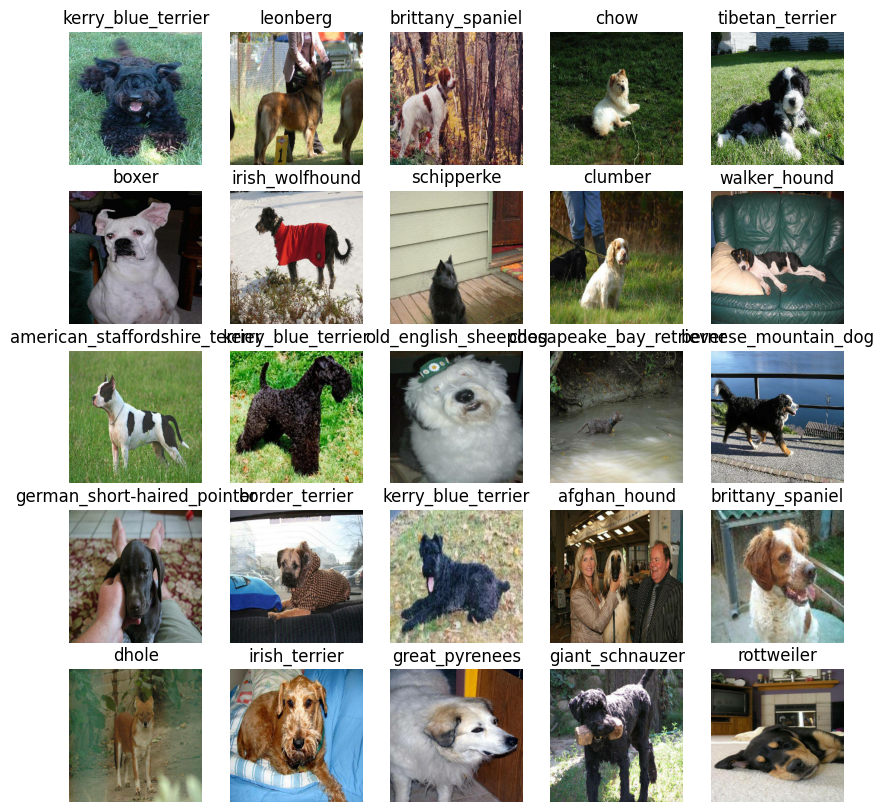

In [ ]:
# Visualize data into training batch
train_images, train_labels = next(train_data.as_numpy_iterator())
train_images, train_labels
show_25_images(train_images, train_labels)

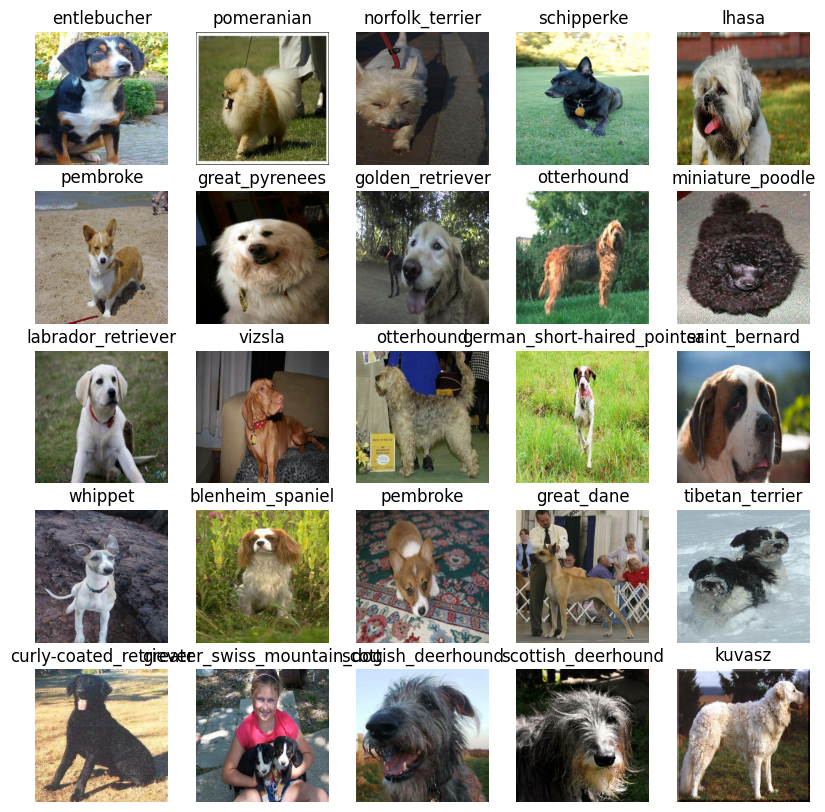

In [ ]:
 # Visualizing a validation batch
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

## Building a model
* The imput shape in the form of tensor, to model
* The output shape, image labels in form of tensor of the model
* The URL of the model want to use

In [ ]:
# Setup input shape to the model
IMG_SIZE = 224
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # batch, height, width, colour channels

# Setup output shape of the model
OUTPUT_SHAPE = len(unique_breeds)

# Setup model URL from TensorFlow Hub
MODEL_URL = "https://www.kaggle.com/models/google/mobilenet-v2/frameworks/tensorFlow2/variations/130-224-classification/versions/1?tfhub-redirect=true"


## Building a model with Keras deep learning model

* Define a function which takes input shape, output shape and the model choosen as input
* Define a layer in Keras model in sequential fashion
* Compiles the model ( should be evaluated and improved)
* Builds the model the input shape it will be getting
* Returns the model

In [ ]:
# Create a function which creates a Keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building model with: ", MODEL_URL)

  # Setup the model layers
  model = tf.keras.Sequential([
      hub.KerasLayer(MODEL_URL), # Layer 1 input layer
      tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                            activation="softmax") # Layer 2 output layer
  ])

  # Compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=["accuracy"]
  )

  # Build the model
  model.build(INPUT_SHAPE)
  return model

In [ ]:
model = create_model()
model.summary()

Building model with:  https://www.kaggle.com/models/google/mobilenet-v2/frameworks/tensorFlow2/variations/130-224-classification/versions/1?tfhub-redirect=true
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


In [ ]:
outputs = np.ones(shape=(1, 1, 1280))
outputs

array([[[1., 1., 1., ..., 1., 1., 1.]]])

## Creating callbacks

* Callbacks are helper functions a model can use during training to do such things as save it progress, check it progress, or stop training early if a model stops improving.

* Two callbacks will be created, one for TensorBoard which helps track of the model progress and another for early stopping which prevents from training for too long.

## TensorBoard

* 3 things shoud be done to setup TensorBoard
1. Load the TensorBoard notebook extension
2. Create TensorBoard callback which is able to save logs to a directory and pass it to the model`s fit() function.
3. Visualize model`s training logs with the %tensorboard magic function

In [ ]:
# Load TensorBoard notebook extension
%load_ext tensorboard

In [ ]:
import datetime

# Create a function to build a TensorBoard callback
def create_tensorboard_callback():
  # Create a directory for storing TensorBoard logs
  logdir = os.path.join("/content/drive/MyDrive/Dog vision/logs",
                        # Make it so the logs get tracked whenever experiment has been performed
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

## Early stopping callback

https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/EarlyStopping



In [ ]:
# Create early stop callback function
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                 patience=3)

## Training a model on a subset of data

Model will be trained on 1000 images, to make sure everything is working fine

In [ ]:
NUM_EPOCHS = 100 #@param {type:"slider", min:10, max:100, step:10}

In [ ]:
# Check to make sure GPU still running
print("GPU" , "available" if tf.config.list_physical_devices("GPU") else "not available")

GPU available


## Create a function which create a model

1. Create a model using create_model()
2. Setup a TensorBoard callback using create_tensorboard_callback()
3. Call fit() function on the model to pass training data, validation data, number of epochs (NUM_EPOCHS), and the callbacks functions
4. Return the model

In [ ]:
# Build a function to train and return a trained model
def train_model():
  """
  Train a gien model and returns the trained model
  """
  # Create a model
  model = create_model()

  # Create new TensorBoard session everytime when model is retrained
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data passing it the callbacks
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])
  # Return the fitted model
  return model

In [ ]:
# USE THIS TO START THE WHOLE PROCESS
# Fit the model to the data
#model = train_model() # USE THIS TO START THE WHOLE PROCESS

## Checking the TensorBoard logs

The TensorBoard magic function %tensorboard will access the logs directory Dog vision/logs and visualize its content

In [ ]:
%tensorboard --logdir /content/drive/MyDrive/Dog\ vision/logs

Output hidden; open in https://colab.research.google.com to view.

## Making and evaluating predictions using a trained model

In [ ]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Make predictions on validation data (this is not used to train on)
predictions = model.predict(val_data, verbose=1)
predictions

63/63 [==============================] - 232s 149ms/step


array([[0.01403503, 0.00111192, 0.00508027, ..., 0.01424304, 0.00917594,
        0.00017442],
       [0.00205444, 0.01191762, 0.00590571, ..., 0.00536855, 0.00086299,
        0.02607488],
       [0.00302465, 0.00115542, 0.00093079, ..., 0.00437055, 0.00052265,
        0.01451154],
       ...,
       [0.00911083, 0.00754758, 0.00028122, ..., 0.0011123 , 0.00346145,
        0.05921905],
       [0.01041734, 0.00182929, 0.00519831, ..., 0.00373257, 0.00167665,
        0.00050022],
       [0.00474152, 0.00183611, 0.01559817, ..., 0.00166192, 0.00539453,
        0.04575263]], dtype=float32)

In [ ]:
predictions.shape

(2000, 120)

In [ ]:
len(y_val)

2000

In [ ]:
len(unique_breeds)

120

In [ ]:
np.sum(predictions[0])

1.0

In [ ]:
# First prediction
index = 44
print(predictions[index])
print(f"Find max value of probability of prediction:  {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Prediction: {unique_breeds[np.argmax(predictions[index])]}")

[1.80329371e-03 2.58215680e-03 5.09082247e-03 3.28652008e-04
 6.01241924e-03 1.67714432e-02 3.55189177e-03 2.43638344e-02
 3.00796260e-03 2.12696055e-03 4.42072330e-03 7.16892013e-04
 2.20084540e-03 1.62384044e-02 4.81131859e-03 6.48643589e-03
 1.17631078e-01 4.78465576e-03 1.01971882e-03 1.09399501e-02
 6.43233187e-04 3.94882541e-03 1.12429145e-04 3.64709122e-04
 1.36685744e-03 1.71816256e-02 5.61577175e-03 1.81225524e-03
 1.42633298e-03 1.27524603e-03 2.25973921e-03 4.14195238e-04
 2.93850107e-03 1.09782638e-02 6.44373801e-03 3.31926905e-03
 8.71904865e-02 3.54684051e-03 8.95597332e-04 1.86260906e-03
 3.57988081e-03 1.37539743e-03 4.93064115e-04 3.02174641e-03
 2.73283315e-03 2.13999022e-03 4.73056547e-03 1.63102418e-03
 3.71756090e-04 6.20789919e-03 4.93591372e-03 3.64950253e-03
 8.52476223e-04 6.38548508e-02 6.23537088e-03 4.04285081e-03
 5.54512767e-03 6.75753923e-03 1.22913963e-03 1.23082125e-03
 5.62487962e-03 3.54600772e-02 5.65055385e-03 4.39484045e-03
 6.51719887e-03 3.787831

In [ ]:
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

## Evaluating and Scalability

In [ ]:
# Turn prediction probabilities into their respective label
def get_pred_label(prediction_probabilities):
  """
  Turn and array of prediction probabilities into a label.
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

# Get a predicted label based on array of prediction probabilities
pred_label = get_pred_label(predictions[44])
pred_label

'border_collie'

In [ ]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

## Create a function to unbach a dataset
*  Since data is in batch data set, shoud be unbachified to make predictions on validation images and then compare those images to validation labels


In [ ]:
# Create a function to unbach a batched dataset
def unbatchify(data):
  """
  Takes a batched dataset of (image, label) Tensors and returns separate arrays of images and labels.
  """
  images = []
  labels = []

  # Loop through unbached data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels

# Unbachify validation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.96884924, 0.9701885 , 0.6773138 ],
         [0.9649684 , 0.9649684 , 0.6752449 ],
         [0.97255224, 0.97255224, 0.6897149 ],
         ...,
         [0.94544876, 0.93533266, 0.63851905],
         [0.9122807 , 0.90027964, 0.59165734],
         [0.6266023 , 0.6167168 , 0.30141547]],
 
        [[0.9636907 , 0.9677085 , 0.69290984],
         [0.97148985, 0.97514886, 0.7090773 ],
         [0.9998248 , 0.99992114, 0.74782914],
         ...,
         [0.97280353, 0.9686894 , 0.715118  ],
         [0.9849285 , 0.99132735, 0.7000457 ],
         [0.8505023 , 0.8618907 , 0.55982476]],
 
        [[0.94763345, 0.9589167 , 0.70516145],
         [0.96966976, 0.9795524 , 0.73575866],
         [0.9953722 , 0.99858195, 0.7804973 ],
         ...,
         [0.8728771 , 0.8872267 , 0.69398195],
         [0.8451019 , 0.8824005 , 0.6274633 ],
         [0.7930096 , 0.83910555, 0.5551244 ]],
 
        ...,
 
        [[0.47171637, 0.37899917, 0.3959688 ],
         [0.23060554, 0.1464493 , 0.15993

## Visualize model predictions


1.   Prediction labels
2.   Validation labels
3.   Validation images

Function:

1. Takes an array of prediction probabilities, an array of truth labels and array of images and an integer
2. Convert the prediction probabilities to a predicted label.
3. Plot the predicted label, its predicted probability, the truth label and the target image to a single plot.




In [ ]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth and image for sample n
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  # Plot image & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change colour of the title depending on prediction if the prediction right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  # Change plot title to be predicted, probability of predictions and truth labels
  plt.title("{} {:2.0f}% {}".format(pred_label,
                                    np.max(pred_prob)*100,
                                    true_label),
                                    color=color)

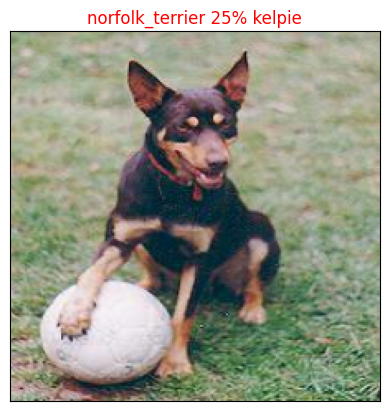

In [ ]:
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images,
          n=42)

In [ ]:
# View model top predictions...
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plot the top 10 highest prediction confidences along with the truth label for sample n
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]

  # Find a top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]

  # Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")

  # Change the color of true labels
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass

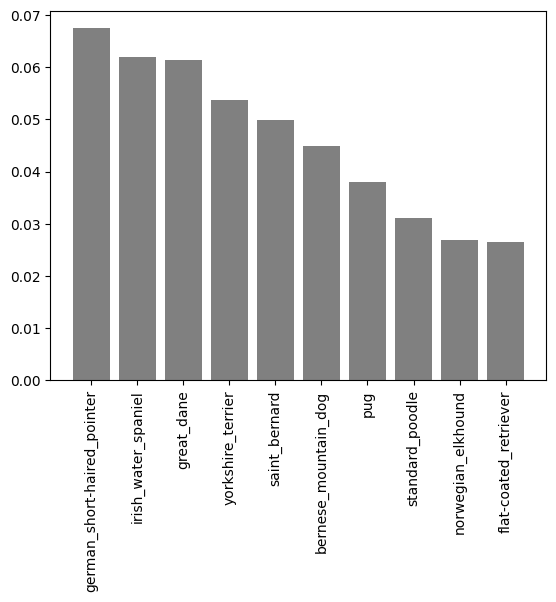

In [ ]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=9)

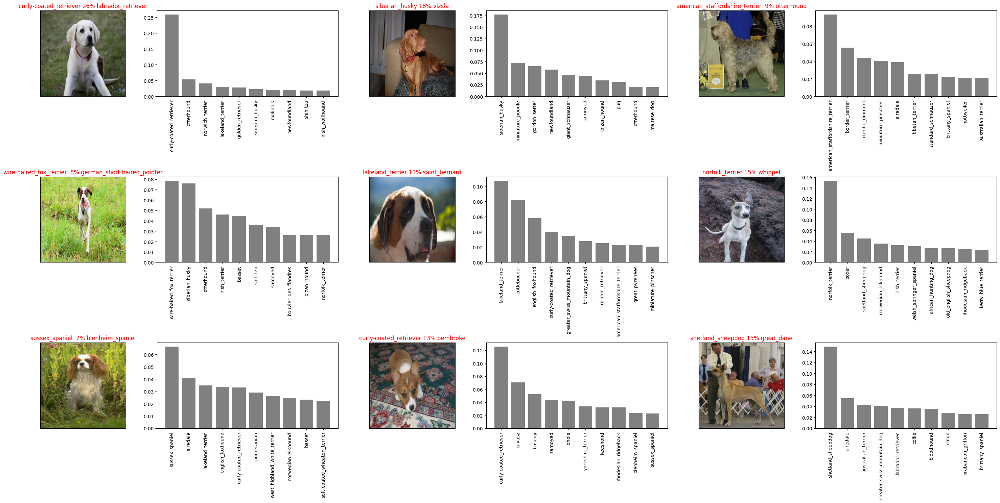

In [ ]:
# Check few predictions and their different values
i_multiplier = 10 # This can be change
num_rows = 3
num_cols = 3
num_images = num_rows*num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))

for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                 labels=val_labels,
                 n=i+i_multiplier)
  plt.tight_layout(h_pad=1.0)
plt.show()

## Saving and reloading trained models

In [ ]:
# Create a function to save a model
def save_model(model, suffix=None):
  """
  Saves a given model in models directory and append a suffix (string)
  """
  # Create a model directory pathname with current time
  modeldir = os.path.join("/content/drive/MyDrive/Dog vision/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5" # save format of model
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

In [ ]:
# Create a function to load a trained model
def load_model(model_path, suffix=None):
  """
  Loads a saved model from specified path
  """
  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer": hub.KerasLayer})
  return model

In [ ]:
# Check save and load functions
# Save trained model on 10000 images
#save_model(model, suffix="10000-images-mobilenetv2-Adam")

In [ ]:
# Check load a trained model
#loaded_10000_image_model = load_model("/content/drive/MyDrive/Dog vision/models/20240328-09001711616428-10000-images-mobilenetv2-Adam.h5")

In [ ]:
# Evaluate the pre-saved model on the validation set
#model.evaluate(val_data)

In [ ]:
#len(X), len(y), len(X_train), len(y_train), len(X_val), len(y_val)

## Training a big dog model (on the full data)

In [ ]:
# Create a data batch with the full data set
full_data = create_data_batches(X, y)

Creating training data batches...


In [ ]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Create a model for full model
full_model = create_model()

Building model with:  https://www.kaggle.com/models/google/mobilenet-v2/frameworks/tensorFlow2/variations/130-224-classification/versions/1?tfhub-redirect=true


In [ ]:
# Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()

# No validation set when training on all the data, so can`t monitor validation accuracy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                             patience=3)

**Note:** Running the cell bellow will take a while, because
CPU that is used in runtime has to load all of the images into memory.

In [ ]:
# Fit the full model to the full data
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 46s 127ms/step - loss: 1.3368 - accuracy: 0.6712
Epoch 2/100
320/320 [==============================] - 40s 125ms/step - loss: 0.4055 - accuracy: 0.8809
Epoch 3/100
320/320 [==============================] - 39s 122ms/step - loss: 0.2364 - accuracy: 0.9371
Epoch 4/100
320/320 [==============================] - 40s 124ms/step - loss: 0.1541 - accuracy: 0.9638
Epoch 5/100
320/320 [==============================] - 41s 128ms/step - loss: 0.1075 - accuracy: 0.9784
Epoch 6/100
320/320 [==============================] - 40s 124ms/step - loss: 0.0763 - accuracy: 0.9874
Epoch 7/100
320/320 [==============================] - 39s 123ms/step - loss: 0.0595 - accuracy: 0.9909
Epoch 8/100
320/320 [==============================] - 40s 126ms/step - loss: 0.0450 - accuracy: 0.9952
Epoch 9/100
320/320 [==============================] - 41s 127ms/step - loss: 0.0380 - accuracy: 0.9960
Epoch 10/100
320/320 [==============================] - 42s 130m

In [ ]:
save_model(full_model, suffix="april-full-image-set-mobilenetv2-Adam")

Saving model to: /content/drive/MyDrive/Dog vision/models/20240401-11001711969258-april-full-image-set-mobilenetv2-Adam.h5...


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'/content/drive/MyDrive/Dog vision/models/20240401-11001711969258-april-full-image-set-mobilenetv2-Adam.h5'

In [ ]:
# Load full images model load_10000_image_model
#full_model = load_model("/content/drive/MyDrive/Dog vision/models/20240328-09001711616428-10000-images-mobilenetv2-Adam.h5")

## Making predictions on test data set

Since the model has been trained on in the form of tensor batches, to make predictions on the test data, have to get it in the same format.

In [ ]:
# Load test image filenames
test_path = "/content/drive/MyDrive/Dog vision/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['/content/drive/MyDrive/Dog vision/test/e5ded7a736b3336729463af8d74a09c9.jpg',
 '/content/drive/MyDrive/Dog vision/test/e379ba26a5e2e22e85975b839e0e401b.jpg',
 '/content/drive/MyDrive/Dog vision/test/e73efb021b7b49e328b2159d34060b82.jpg',
 '/content/drive/MyDrive/Dog vision/test/e5fa615e36dc3b2b3f554aa5097a6ece.jpg',
 '/content/drive/MyDrive/Dog vision/test/e6d6ff5b33e6174158d5ab05a7eda95c.jpg',
 '/content/drive/MyDrive/Dog vision/test/e14211c7b8cba3e46d5802291b765be7.jpg',
 '/content/drive/MyDrive/Dog vision/test/e2b4d6b6590fa2941e74238248093eb3.jpg',
 '/content/drive/MyDrive/Dog vision/test/e2c3376aeea1057337f02dfc48feee62.jpg',
 '/content/drive/MyDrive/Dog vision/test/e2888231cedd08540816e629c0733922.jpg',
 '/content/drive/MyDrive/Dog vision/test/df86ba50c4d0b597af0d23bda37eb10e.jpg']

In [ ]:
len(test_filenames)

10357

In [ ]:
# Convert test filenames into test data batches
test_data = create_data_batches(test_filenames, test_data=True)

Creating test batches


In [ ]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

**Note**: Calling predict() on full model and passing it the test data batch,
will take long time to run.

In [ ]:
# Make predictions on test data batch
test_predictions = full_model.predict(test_data,
                                                   verbose=1)

324/324 [==============================] - 298s 906ms/step


In [ ]:
# backup for load model and save predictions (NumPy) to csv (for access later)
#np.savetxt("/content/drive/MyDrive/Dog vision/preds_array.csv", test_predictions, delimiter=",")

In [ ]:
# load backup numpy array from saved csv file
#test_predictions = loadtxt(/content/drive/MyDrive/Dog vision/preds_array.csv, delimiter=",")

In [ ]:
# Check for the first ten
test_predictions[:10]

array([[4.44589504e-10, 1.89408253e-10, 4.05693669e-07, ...,
        8.05987943e-10, 2.80435097e-09, 2.68570677e-09],
       [4.23402341e-10, 7.32598823e-13, 2.66687838e-10, ...,
        1.65074981e-10, 1.70324288e-08, 8.22717894e-08],
       [4.65347982e-09, 2.12300762e-07, 3.11980671e-07, ...,
        2.20124775e-06, 4.04473299e-09, 1.33220270e-08],
       ...,
       [4.20803474e-07, 1.06660325e-09, 5.92353970e-08, ...,
        1.51256671e-07, 1.05690253e-06, 3.36057511e-08],
       [1.41691539e-08, 9.08655920e-07, 6.03465855e-09, ...,
        8.70644897e-07, 1.13732436e-04, 7.01191194e-09],
       [4.89057189e-12, 5.30285343e-13, 2.65354524e-13, ...,
        7.75824752e-11, 2.91831706e-12, 5.47168109e-11]], dtype=float32)

In [ ]:
# Check shape, should be (10357, 120)
test_predictions.shape

(10357, 120)

## Making predictions on custom images
To make predictions on custom images:

1. Get the filepath of own images or create a folder inside a project and upload them
2. Turn the filepaths into data batches using `create_data_batches()`. And since custom images wont have lab els, set the test_data parameter to True.
3. Pass the custom image data b atch to the full_model` predict() method.
4. Convert the prediction output probabilities to predictions labels.
5. Compare the predicted labels to the custom images.

In [ ]:
# Get custom image filepaths
custom_path = "/content/drive/MyDrive/Dog vision/custom_images/"
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]

In [ ]:
custom_image_paths # Should contain 3 dingo photos and one boxer

['/content/drive/MyDrive/Dog vision/custom_images/dingo2.png',
 '/content/drive/MyDrive/Dog vision/custom_images/dingo3.png',
 '/content/drive/MyDrive/Dog vision/custom_images/dingo1.png',
 '/content/drive/MyDrive/Dog vision/custom_images/boxer.png',
 '/content/drive/MyDrive/Dog vision/custom_images/grdog.png']

In [ ]:
# Turn custom images into batch datasets
custom_data = create_data_batches(custom_image_paths, test_data=True)
custom_data

Creating test batches


<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [ ]:
# Make predictions on the custom data
custom_dingo_preds = full_model.predict(custom_data)

1/1 [==============================] - 1s 1s/step


In [ ]:
custom_dingo_preds.shape

(5, 120)

In [ ]:
# Get custom image prediction labels
custom_pred_labels = [get_pred_label(custom_dingo_preds[i]) for i in range(len(custom_dingo_preds))]
custom_pred_labels

['dingo', 'dingo', 'dingo', 'boxer', 'golden_retriever']

In [ ]:
# Get custom images (unbatchify() function won`t work since there aren`t labels)
custom_images = []
# Loop through unbacthed data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

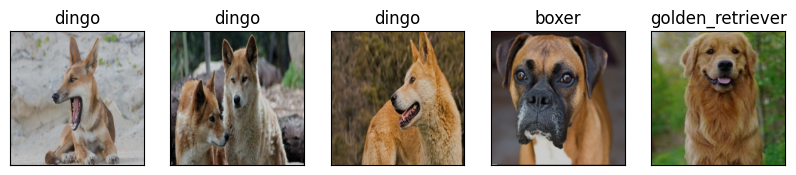

In [ ]:
# Check custom image predictions
plt.figure(figsize=(10, 10))
num_images = len(custom_images)
for i, image in enumerate(custom_images):
    plt.subplot(1, num_images, i+1)
    plt.xticks([])
    plt.yticks([])
    plt.title(custom_pred_labels[i])
    plt.imshow(image)
plt.show()